# Tutorial: CMB map analysis with ``pixell``

This tutorial will show you how to manipulate and analyze CMB maps. We'll work with a real map of the microwave sky obtained by the Atacama Cosmology Telescope and publicly released in 2014. That release included maps of many regions of the sky in both temperature and polarization. We will just work with the temperature map in a small but deep region of the sky, referred to by ACT as "Deep6".

You can download this map from the following Dropbox link:
https://www.dropbox.com/sh/6uzpsyb6a38811d/AAA0VkI6Ro1hTWnkQ1CSDrEta?dl=0

If you want to run this notebook, please place the map in the same directory as this notebook.

Most of the map manipulation functions are in ``pixell.enmap``, so let's load that along with ``numpy`` and ``matplotlib``.

In [32]:
from __future__ import print_function
%load_ext autoreload
%autoreload 2
from pixell import enmap
import numpy as np
import matplotlib.pyplot as plt

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Reading in a map and inspecting it

In [33]:
filename = "actpol_deep6_temperature_car.fits" 
imap = enmap.read_map(filename)
print(imap.shape, imap.dtype)

(1605, 3612) float64


In [34]:
print(imap.wcs)

car:{cdelt:[-0.008333,0.008333],crval:[33.94,0],crpix:[1806,1358]}


In [35]:
print(np.rad2deg(imap.box()))

[[-11.3125  48.9875]
 [  2.0625  18.8875]]


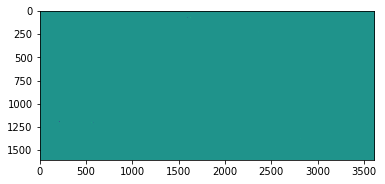

In [36]:
plt.imshow(imap)

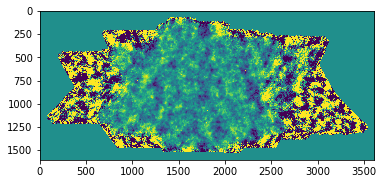

In [37]:
plt.imshow(imap,vmin=-300,vmax=300)

## Visualizing maps with ``pixell.enplot``

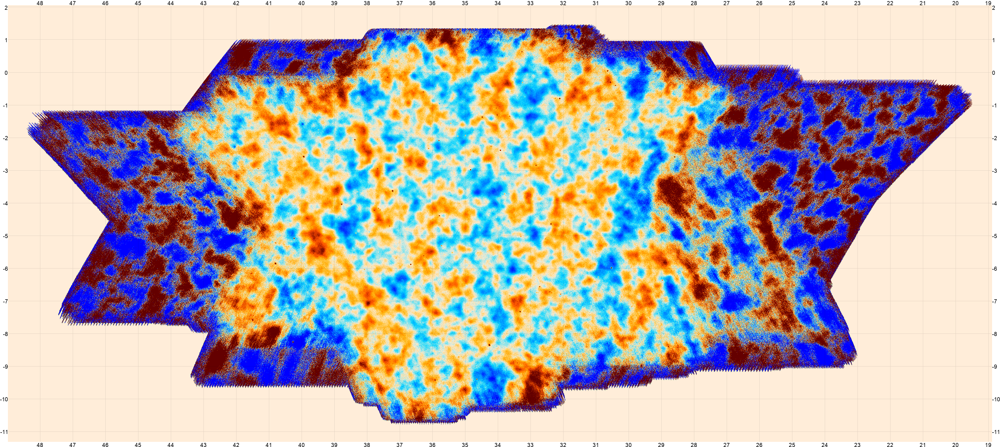

In [38]:
from pixell import enplot
plots = enplot.get_plots(imap,range=300)
enplot.show(plots)

def eshow(x,**kwargs): enplot.show(enplot.get_plots(x,**kwargs))

## Selecting regions of the map

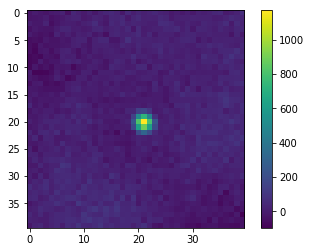

In [39]:
dec,ra = np.deg2rad(np.array((-2.38,33.92)))
width = np.deg2rad(20./60.)
box = np.array([[dec-width/2.,ra-width/2.],[dec+width/2.,ra+width/2.]])
stamp = imap.submap(box)
plt.imshow(stamp)
plt.colorbar()

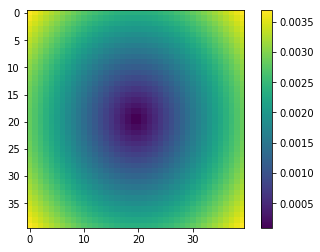

In [40]:
modrmap = stamp.modrmap()
plt.imshow(modrmap)
plt.colorbar()

In [41]:
radius = np.deg2rad(2./60.)
flux_in = stamp[modrmap<radius].mean()
flux_out = stamp[modrmap>=radius].mean()
print(flux_out,flux_in)

17.169485428042027 149.06866636979012


## Slicing and downgrading

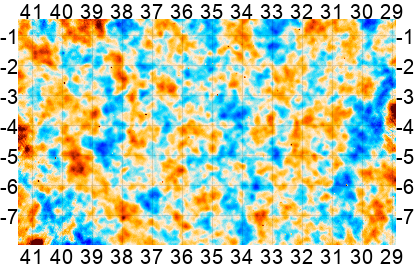

In [42]:
smap = enmap.downgrade(imap[400:-300,900:-1200],4)
eshow(smap,range=300)

## Apodizing

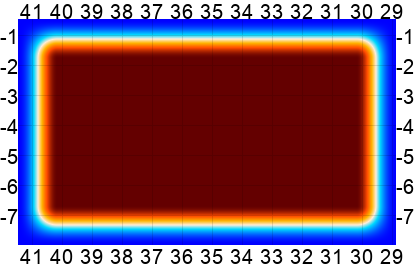

In [43]:
apod_pix=40
taper = enmap.apod(smap*0+1,apod_pix)
eshow(taper)

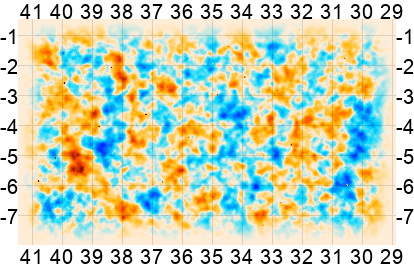

In [44]:
eshow(smap*taper,range=300)

## Fourier transforms and power spectra

In [71]:
kmap = enmap.fft(smap*taper,normalize="phys")
print(kmap.shape)
print(kmap.wcs)
print(kmap.dtype)

(226, 378)
car:{cdelt:[-0.03333,0.03333],crval:[33.94,0],crpix:[226.9,239.9]}
complex128


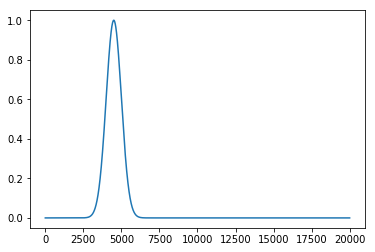

In [68]:
"""
A simple filter
"""

ells = np.arange(0,20000,1)
ell0 = 4500
ellsig = 500
fl = np.exp(-(ells-ell0)**2./2./ellsig**2.)

plt.plot(ells,fl)
plt.show()

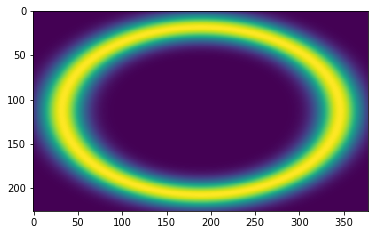

In [69]:
from scipy.interpolate import interp1d

fl2d = interp1d(ells,fl,bounds_error=False,fill_value=True)(modlmap)
plt.imshow(np.fft.fftshift(fl2d))

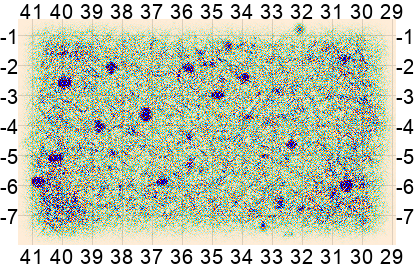

In [70]:
kfiltered = kmap*fl2d
filtered = enmap.ifft(kfiltered,normalize="phy").real

eshow(filtered)

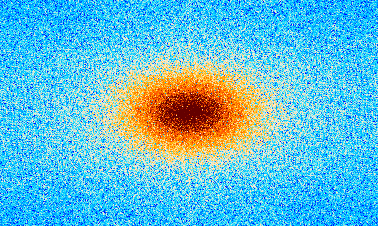

In [61]:
power = (kmap*np.conj(kmap)).real
shifted_power = enmap.samewcs(np.fft.fftshift(np.log10(power)),smap)
eshow(shifted_power,grid=False)

## Binned power spectrum

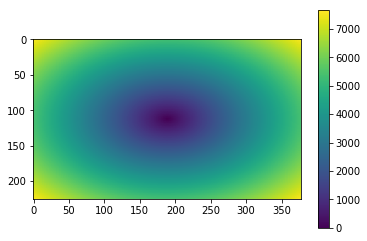

In [29]:
modlmap = smap.modlmap()
plt.imshow(np.fft.fftshift(modlmap))
plt.colorbar()

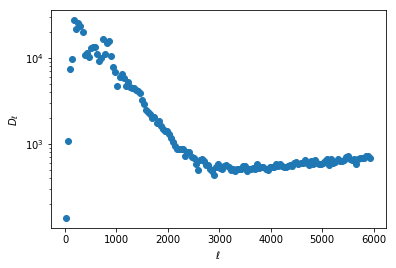

In [30]:
def bin(data,modlmap,bin_edges):
    digitized = np.digitize(np.ndarray.flatten(modlmap), bin_edges,right=True)
    return np.bincount(digitized,(data).reshape(-1))[1:-1]/np.bincount(digitized)[1:-1]

bin_edges = np.arange(0,6000,40)
centers = (bin_edges[1:] + bin_edges[:-1])/2.
w2 = np.mean(taper**2.)
binned_power = bin(power/w2,modlmap,bin_edges)

plt.plot(centers,centers**2*binned_power,marker="o",ls="none")
plt.yscale('log')
plt.xlabel('$\\ell$')
plt.ylabel('$D_{\\ell}$')
plt.show()

## Comparing with theory

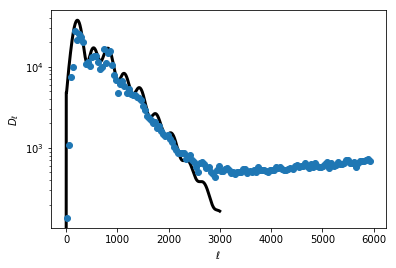

In [31]:
from pixell import powspec
camb_theory = powspec.read_spectrum("camb_theory.dat")
cltt = camb_theory[0,0,:3000]
ls = np.arange(cltt.size)

plt.plot(ls,cltt*ls**2.,lw=3,color='k')
plt.plot(centers,centers**2*binned_power,marker="o",ls="none")
plt.yscale('log')
plt.xlabel('$\\ell$')
plt.ylabel('$D_{\\ell}$')
plt.show()
